
# VGG16 Activation Tour — What Happens to an Image Through Successive Layers?

This notebook loads a **VGG16** network (ImageNet‑pretrained), feeds your image through it, and shows **what each block of filters does** by visualizing intermediate activations.

What you’ll see:
- A quick **device check** (CUDA / Apple MPS / CPU)
- How to **load & preprocess** a color image for VGG
- **Hooked** activations from successive layers (`conv`/`relu`/`pool` in each block)
- For every chosen layer:
  - A compact grid of **top‑K channels** (most active feature maps)
  - A single **feature energy** map (channel‑wise mean) to see where the layer focuses

> Tip: Early layers show small‑scale edges/colors; deeper layers show higher‑level textures/shapes.


> If needed: `pip install torch torchvision pillow matplotlib`

In [1]:

import os, math, numpy as np
import torch
from torch import nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image

# Device selection: CUDA -> Apple Metal (MPS) -> CPU
def get_device():
    if torch.cuda.is_available():
        return torch.device("cuda")
    if hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
        return torch.device("mps")
    return torch.device("cpu")

DEVICE = get_device()
print("Using device:", DEVICE)
if DEVICE.type == "cuda":
    print("CUDA:", torch.cuda.get_device_name(0))
elif DEVICE.type == "mps":
    print("Apple Metal (MPS) backend active")

torch.set_grad_enabled(False)  # we only do inference/visualization


Using device: cuda
CUDA: NVIDIA GeForce RTX 3090


torch.autograd.grad_mode.set_grad_enabled(mode=False)

## Load VGG16 + transforms

In [2]:

from torchvision import models, transforms

# Try to load pretrained weights; if unavailable (e.g., offline), fall back to random init with a warning.
try:
    weights = models.VGG16_Weights.DEFAULT
    vgg = models.vgg16(weights=weights).eval().to(DEVICE)
    preprocess = weights.transforms()
    print("Loaded VGG16 pretrained on ImageNet.")
except Exception as e:
    print("WARNING: Could not load pretrained weights (likely offline). Using random init.\n", e)
    vgg = models.vgg16(weights=None).eval().to(DEVICE)
    preprocess = transforms.Compose([
        transforms.Resize(256, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])


Loaded VGG16 pretrained on ImageNet.


## Pick an image

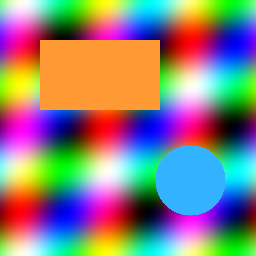

Input tensor: (1, 3, 224, 224)


In [3]:

# Set this to your file path, e.g. IMG_PATH = "your_photo.jpg"
IMG_PATH = None

def load_image(path=None):
    if path and os.path.exists(path):
        img = Image.open(path).convert("RGB")
    else:
        # Synthetic colorful placeholder: gradient + shapes
        w=h=256
        x = np.linspace(0,1,w); y = np.linspace(0,1,h)
        X, Y = np.meshgrid(x, y)
        r = (np.sin(2*np.pi*X*3)+1)/2
        g = (np.cos(2*np.pi*Y*3)+1)/2
        b = (np.sin(2*np.pi*(X+Y)*2)+1)/2
        img_np = np.stack([r,g,b], axis=2)
        # add rectangle and circle
        img_np[40:110, 40:160, :] = [1.0, 0.6, 0.2]
        cy, cx, rad = 180, 190, 35
        yy, xx = np.ogrid[:h, :w]
        mask = (yy-cy)**2 + (xx-cx)**2 <= rad**2
        img_np[mask] = [0.2, 0.7, 1.0]
        img = Image.fromarray((img_np*255).astype(np.uint8))
    return img

img_rgb = load_image(IMG_PATH)
display(img_rgb.resize((256,256)))
inp = preprocess(img_rgb).unsqueeze(0).to(DEVICE)  # (1,3,224,224)
print("Input tensor:", tuple(inp.shape))


## Capture activations with forward hooks

In [4]:

# We'll tap into VGG's features (Sequential of conv/relu/pool layers).
# Indices to watch (conv & pool layers across blocks)
watch_indices = [0, 2, 4,   # conv1_1, conv1_2, pool1
                 5, 7, 9,   # conv2_1, conv2_2, pool2
                 10, 12, 14, 16,  # conv3_1, conv3_2, conv3_3, pool3
                 17, 19, 21, 23,  # conv4_1, conv4_2, conv4_3, pool4
                 24, 26, 28, 30]  # conv5_1, conv5_2, conv5_3, pool5

layer_names = {
    0:"conv1_1", 2:"conv1_2", 4:"pool1",
    5:"conv2_1", 7:"conv2_2", 9:"pool2",
    10:"conv3_1", 12:"conv3_2", 14:"conv3_3", 16:"pool3",
    17:"conv4_1", 19:"conv4_2", 21:"conv4_3", 23:"pool4",
    24:"conv5_1", 26:"conv5_2", 28:"conv5_3", 30:"pool5"
}

activations = {}
hooks = []
for idx in watch_indices:
    def _make_hook(i):
        def hook(module, inp, out):
            # store CPU numpy for easier viz; keep a reference name
            activations[i] = out.detach().cpu()
        return hook
    h = vgg.features[idx].register_forward_hook(_make_hook(idx))
    hooks.append(h)

# Run a forward pass (we only need features)
_ = vgg(inp)

# Clean up hooks after capture
for h in hooks:
    h.remove()

print("Collected layers:", [layer_names[i] for i in activations.keys()])


Collected layers: ['conv1_1', 'conv1_2', 'pool1', 'conv2_1', 'conv2_2', 'pool2', 'conv3_1', 'conv3_2', 'conv3_3', 'pool3', 'conv4_1', 'conv4_2', 'conv4_3', 'pool4', 'conv5_1', 'conv5_2', 'conv5_3', 'pool5']


## Visualization helpers

In [5]:

def upsample_to_img(t, size=(224,224)):
    # t: (1,C,H,W) or (C,H,W) tensor on CPU
    if t.dim() == 3:
        t = t.unsqueeze(0)
    t = F.interpolate(t, size=size, mode="bilinear", align_corners=False)
    return t.squeeze(0)  # (C, H, W)

def show_topk_channels(act, k=16, title="", cols=8):
    # act: (1,C,H,W) on CPU
    C = act.shape[1]
    k = min(k, C)
    # Select channels by mean activation
    means = act.mean(dim=(0,2,3))
    topk = torch.topk(means, k).indices.tolist()
    up = upsample_to_img(act[:, topk, :, :])  # (k, 224, 224)

    rows = math.ceil(k / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols*1.6, rows*1.6), dpi=130)
    fig.suptitle(title)
    for i, ax in enumerate(np.array(axes).ravel()):
        if i < k:
            ax.imshow(up[i], cmap="viridis")
            ax.set_title(f"ch {topk[i]}", fontsize=8)
        ax.axis("off")
    plt.tight_layout(); plt.show()

def show_feature_energy(act, title=""):
    # Channel-wise mean -> single map, upsample to input size
    energy = act.mean(dim=1, keepdim=True)  # (1,1,H,W)
    up = upsample_to_img(energy)            # (1, 224, 224) squeezed to (224,224) by next line
    plt.figure(figsize=(4,4), dpi=140)
    plt.imshow(up.squeeze(0), cmap="magma")
    plt.title(title)
    plt.axis("off"); plt.show()


## See what each layer is doing

Layer 0: conv1_1 — shape (64, 224, 224)


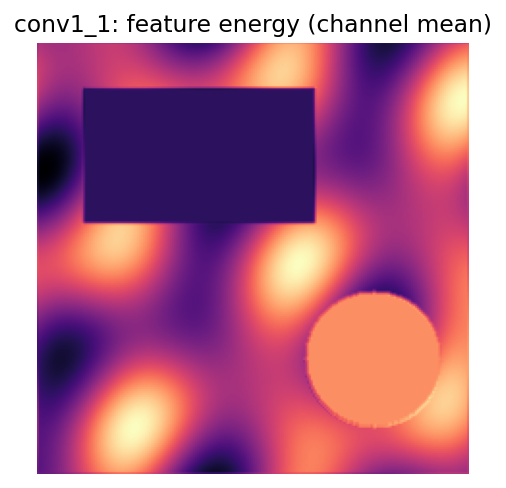

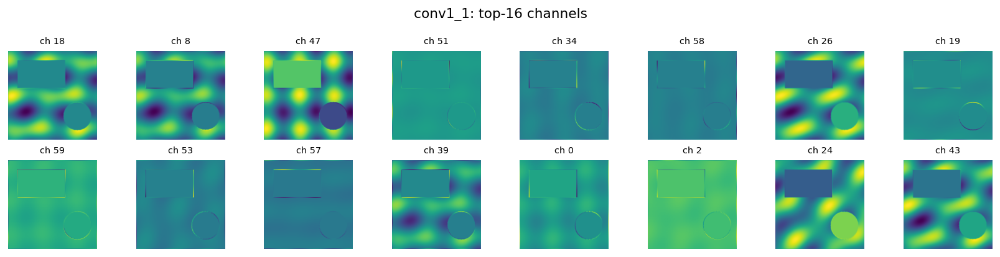

Layer 2: conv1_2 — shape (64, 224, 224)


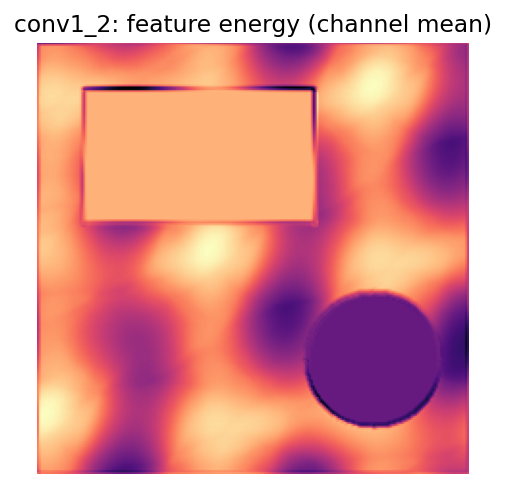

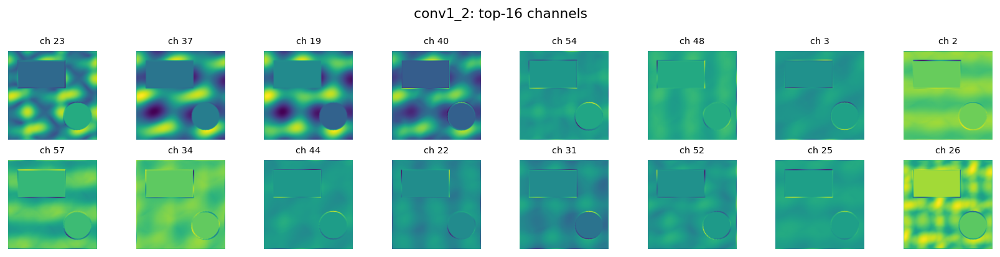

Layer 4: pool1 — shape (64, 112, 112)


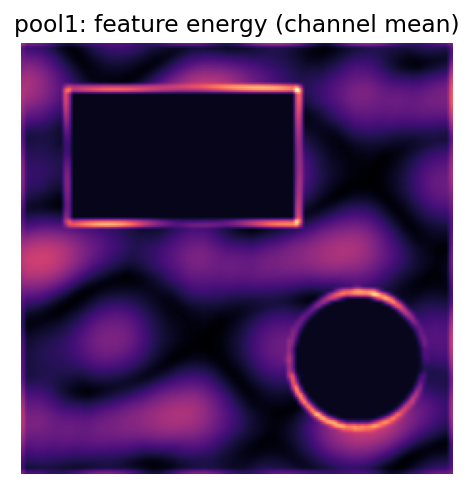

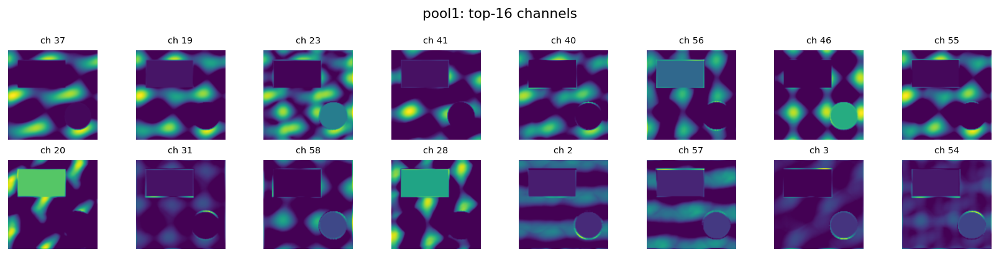

Layer 5: conv2_1 — shape (128, 112, 112)


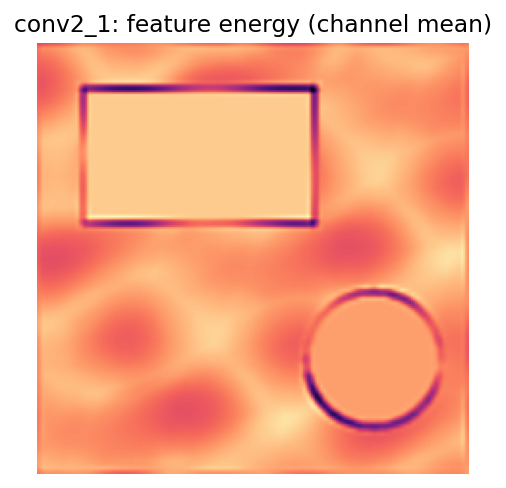

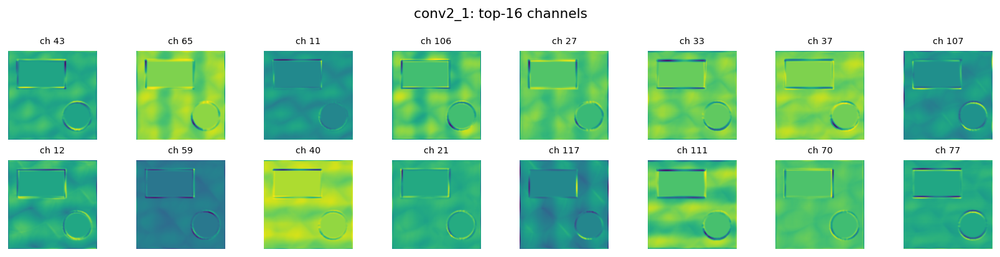

Layer 7: conv2_2 — shape (128, 112, 112)


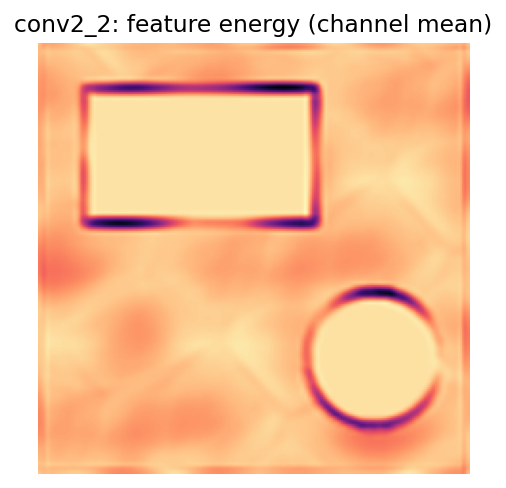

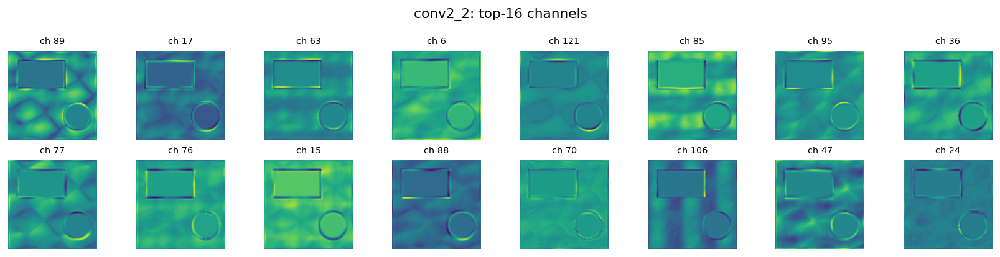

Layer 9: pool2 — shape (128, 56, 56)


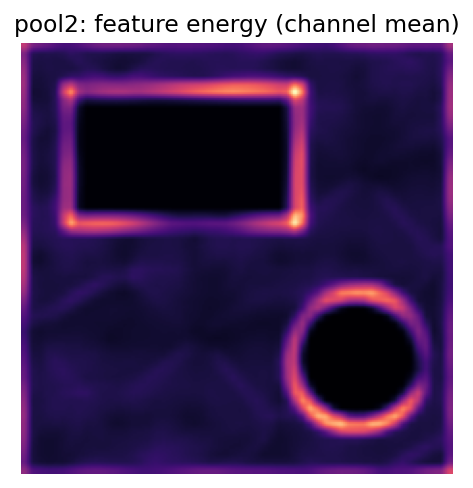

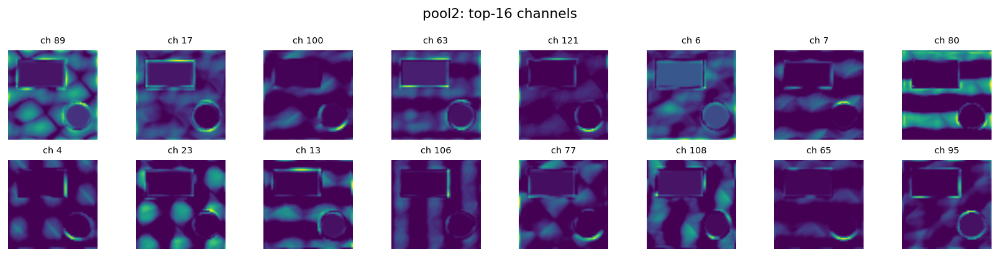

Layer 10: conv3_1 — shape (256, 56, 56)


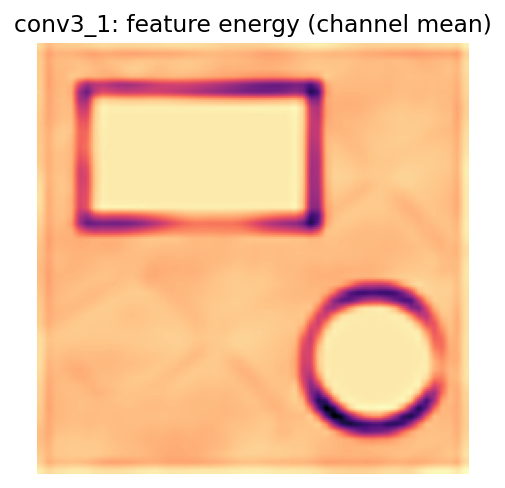

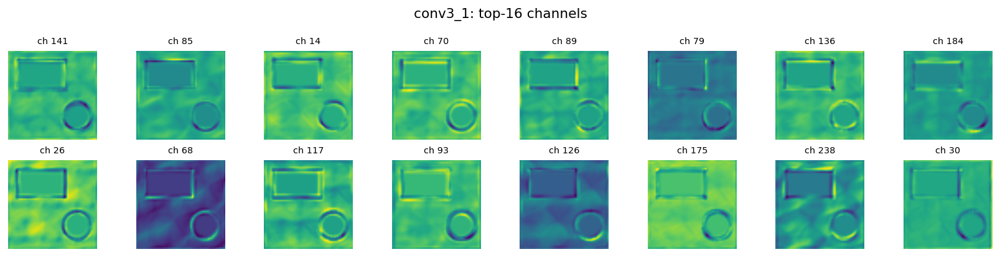

Layer 12: conv3_2 — shape (256, 56, 56)


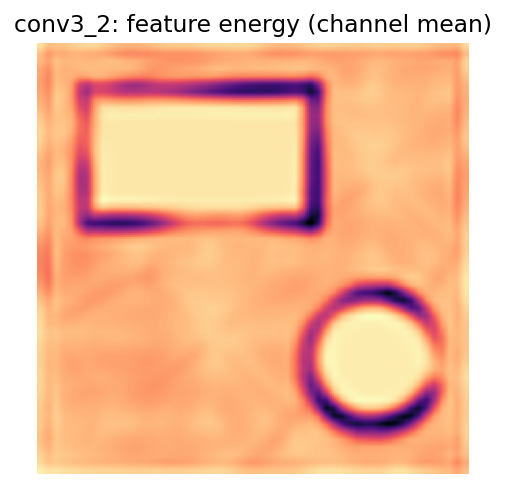

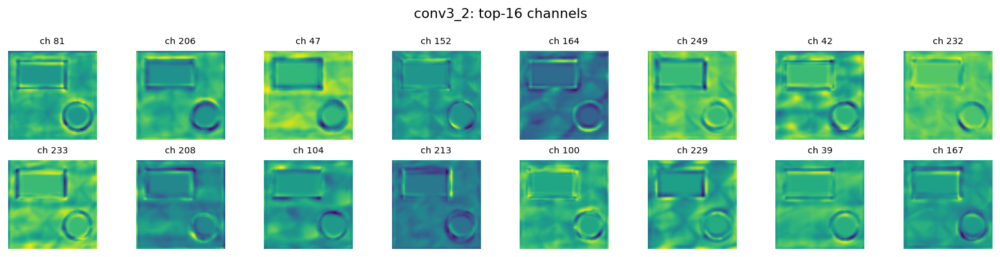

Layer 14: conv3_3 — shape (256, 56, 56)


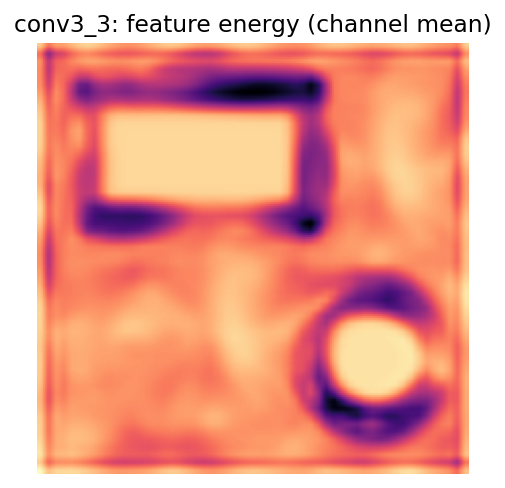

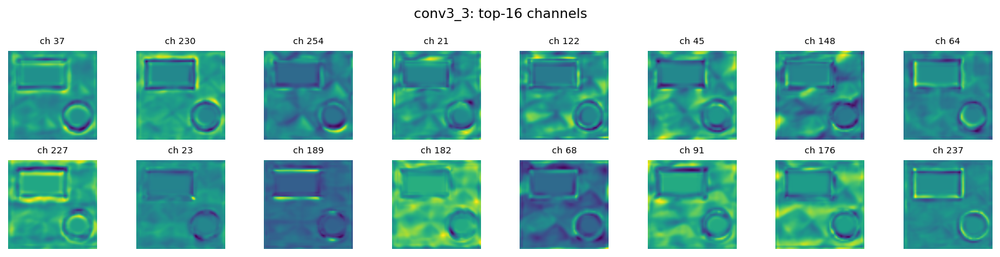

Layer 16: pool3 — shape (256, 28, 28)


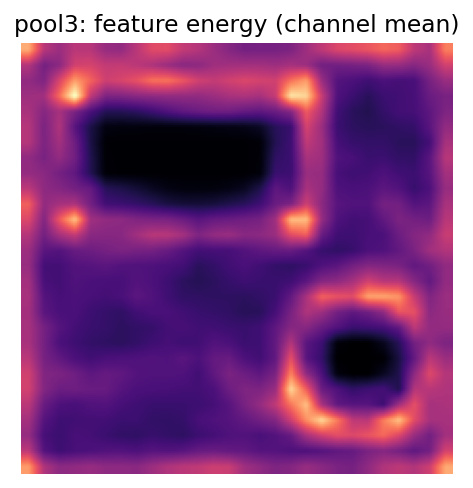

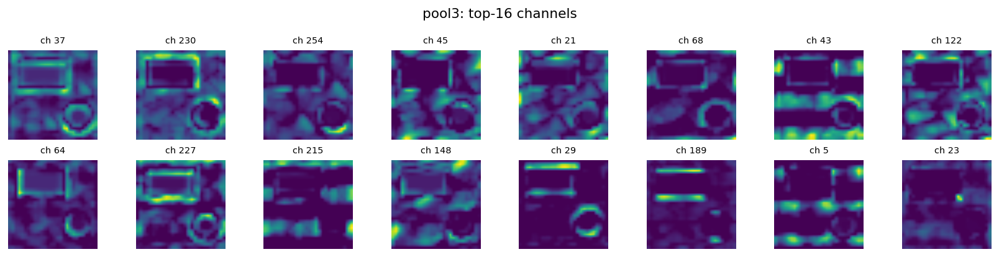

Layer 17: conv4_1 — shape (512, 28, 28)


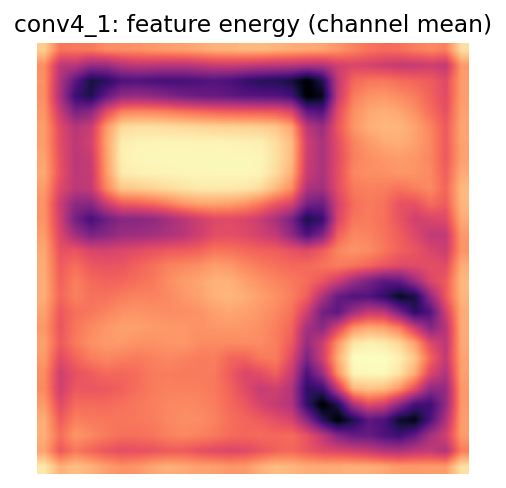

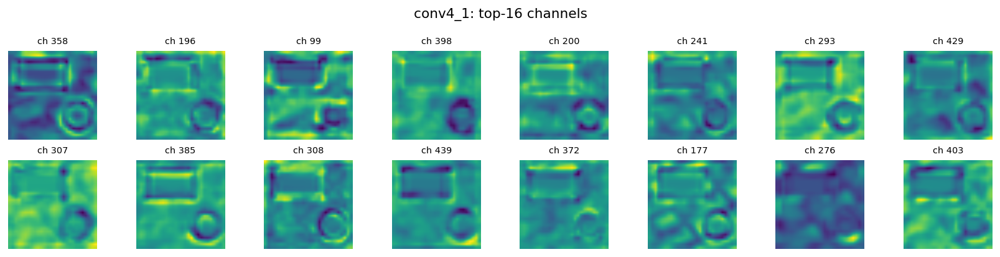

Layer 19: conv4_2 — shape (512, 28, 28)


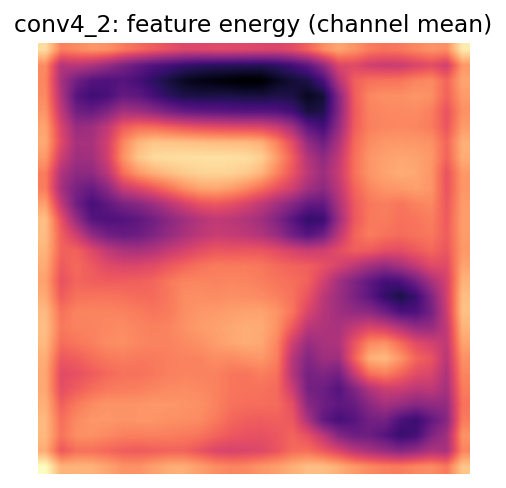

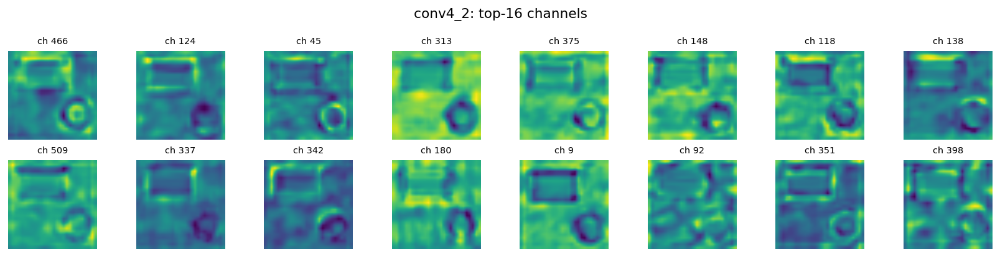

Layer 21: conv4_3 — shape (512, 28, 28)


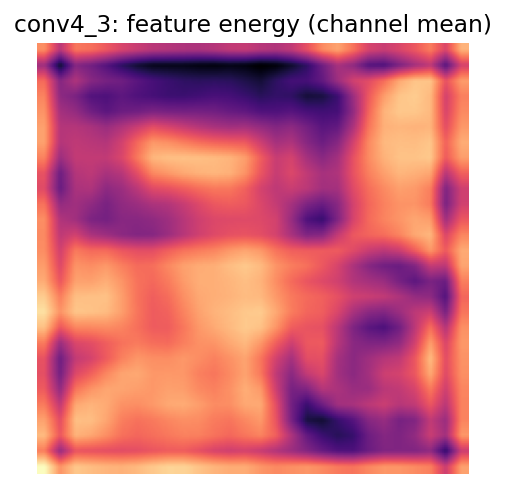

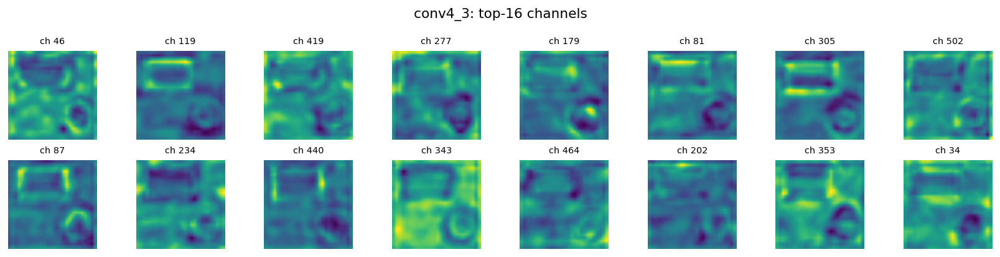

Layer 23: pool4 — shape (512, 14, 14)


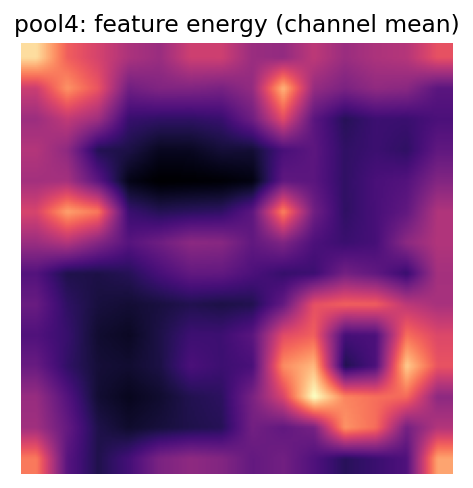

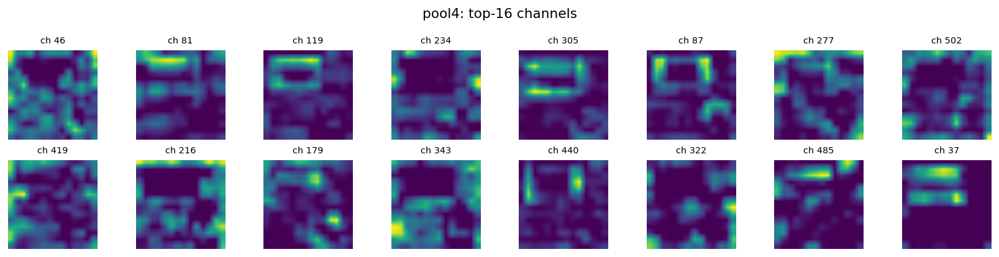

Layer 24: conv5_1 — shape (512, 14, 14)


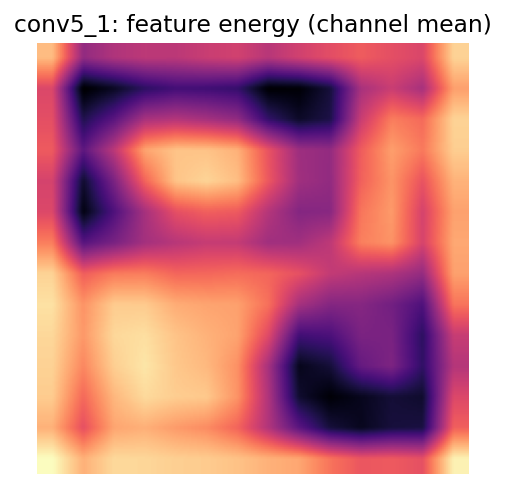

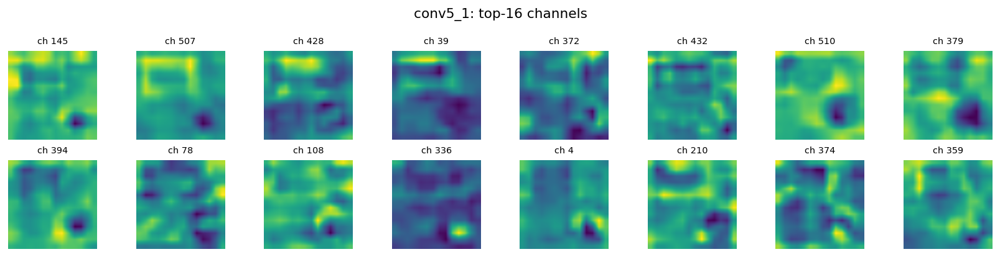

Layer 26: conv5_2 — shape (512, 14, 14)


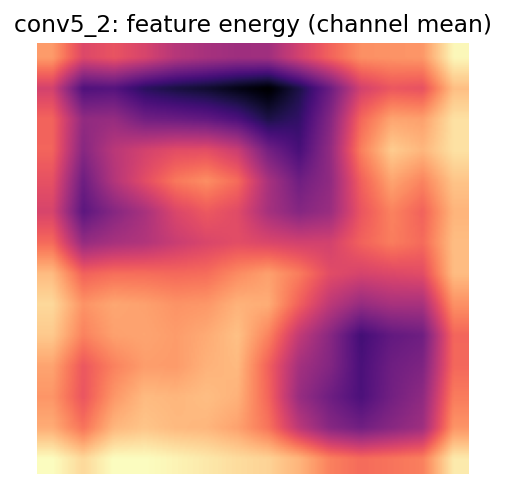

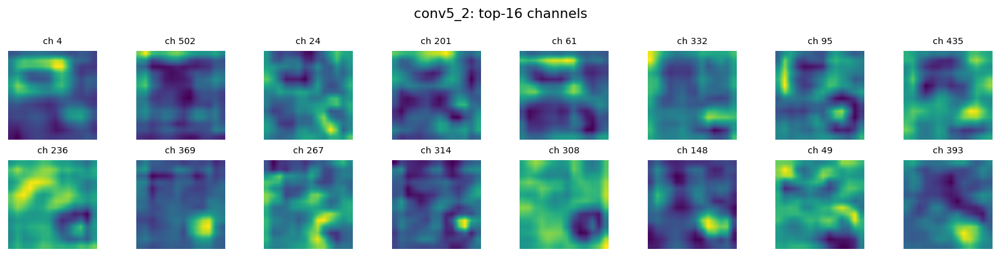

Layer 28: conv5_3 — shape (512, 14, 14)


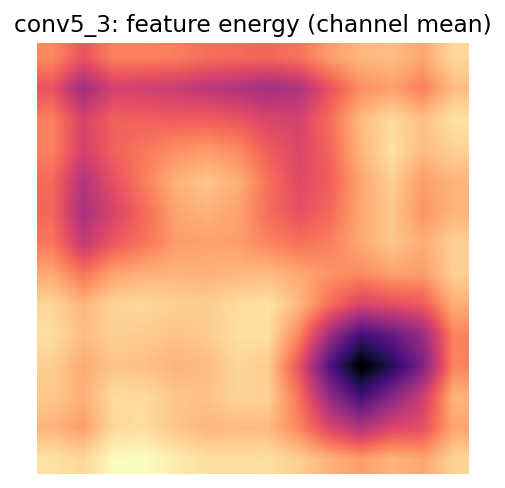

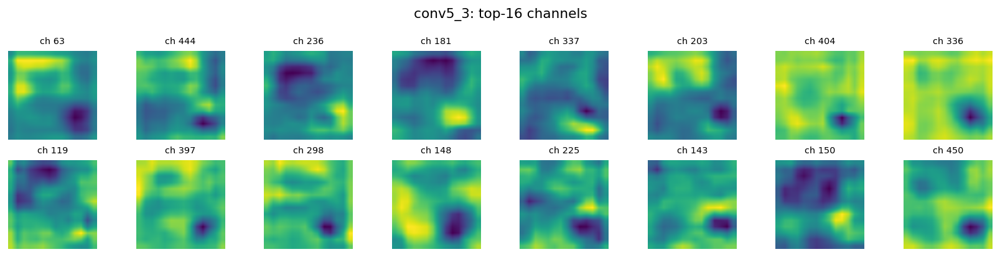

Layer 30: pool5 — shape (512, 7, 7)


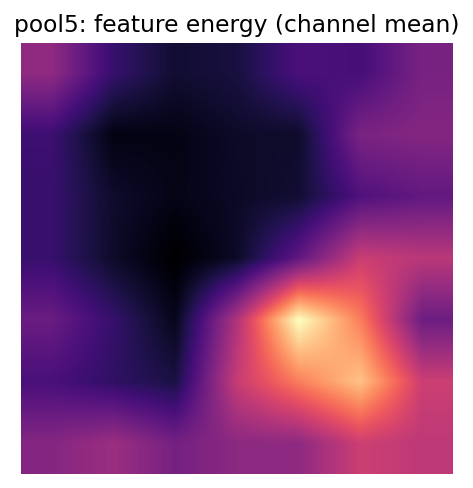

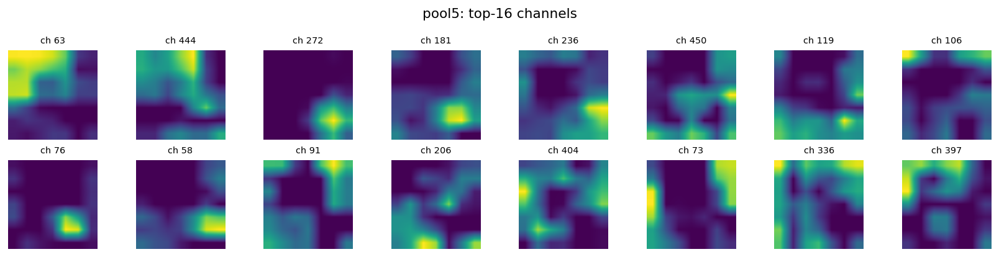

In [6]:

# Parameters for visualization
TOP_K = 16   # number of channels to show per layer
COLS  = 8    # grid columns for channel gallery

for idx in watch_indices:
    act = activations[idx]  # (1,C,H,W), CPU
    name = layer_names[idx]
    print(f"Layer {idx}: {name} — shape {tuple(act.shape[1:])}")
    # Feature energy (mean across channels)
    show_feature_energy(act, title=f"{name}: feature energy (channel mean)")
    # Top-K channels
    show_topk_channels(act, k=TOP_K, cols=COLS, title=f"{name}: top-{TOP_K} channels")



### Notes
- **Energy maps** (channel mean) show where a layer focuses, independent of specific channels.
- **Top‑K channel grids** reveal representative filters—edges in early layers, textures/parts later.
- If you switch `IMG_PATH` to your own photo, the patterns shift to suit the content.
- If you're offline and can't pull ImageNet weights, the model will be randomly initialized (activations will look noisy). Re‑run when online for meaningful results.
